In [1]:
libraries = c("raster","ggplot2","png","grid","magrittr","dplyr","ggplot2","gridExtra","RColorBrewer")
for(x in libraries) {
    library(x,character.only=TRUE,warn.conflicts=FALSE) }

windowsFonts(Times = windowsFont("Times New Roman"))
base_sz = 11 # base_size parameter

# options(jupyter.plot_mimetypes = "image/svg+xml") 
clrs = brewer.pal(8,"Set1")

'%&%' <- function(x,y)paste0(x,y)
'%!in%' <- function(x,y)!('%in%'(x,y))
    
# Initialization of array for recorded plots
plot_point_sizes <- c(); nm <- c(); plot_point_sizes <- list()

YellowMark = 1; OrangeMark = 1.5; RedMark = 2
myColors <- brewer.pal(5,"Set1")

Loading required package: sp


# LGAs of Nigeria

In [2]:
# Here I follow: http://stackoverflow.com/questions/22038640/labeling-center-of-map-polygons-in-r-ggplot

## Fortifying a map makes the data frame ggplot uses to draw the map outlines.
## "region" or "id" identifies those polygons, and links them to your data. 
nga = getData("GADM",country="Nigeria",level=2)
map = fortify(nga)
head(nga@data)

# Two additional maps
nga1 <- getData("GADM", country = "Nigeria", level = 1)
nga0 <- getData("GADM", country = "Nigeria", level = 0)
map1 <- fortify(nga1)
map0 <- fortify(nga0)

## Data frame needs a column with matching ids to set as the map_id aesthetic in ggplot
idList = nga@data$ID_2

## "coordinates" extracts centroids of the polygons, in the order listed at worldMap@data
centroids.df = as.data.frame(coordinates(nga))
names(centroids.df) = c("Longitude", "Latitude")  #more sensible column names

nga.df = data.frame(id=idList,centroids.df)

Regions defined for each Polygons


OBJECTID,ID_0,ISO,NAME_0,ID_1,NAME_1,ID_2,NAME_2,HASC_2,CCN_2,CCA_2,TYPE_2,ENGTYPE_2,NL_NAME_2,VARNAME_2
1,163,NGA,Nigeria,1,Abia,1,Aba North,,NA,,Local Authority,Local Authority,,
2,163,NGA,Nigeria,1,Abia,2,Aba South,,NA,,Local Authority,Local Authority,,
3,163,NGA,Nigeria,1,Abia,3,Arochukw,,NA,,Local Authority,Local Authority,,Arochukwu
4,163,NGA,Nigeria,1,Abia,4,Bende,,NA,,Local Authority,Local Authority,,
5,163,NGA,Nigeria,1,Abia,5,Ikwuano,,NA,,Local Authority,Local Authority,,
6,163,NGA,Nigeria,1,Abia,6,Isiala Ngwa North,,NA,,Local Authority,Local Authority,,


Regions defined for each Polygons
Regions defined for each Polygons


In [3]:
nga@data %>% filter(ID_2==228)

OBJECTID,ID_0,ISO,NAME_0,ID_1,NAME_1,ID_2,NAME_2,HASC_2,CCN_2,CCA_2,TYPE_2,ENGTYPE_2,NL_NAME_2,VARNAME_2
228,163,NGA,Nigeria,12,Edo,228,EsanCent,,NA,,Local Authority,Local Authority,,Esan Central


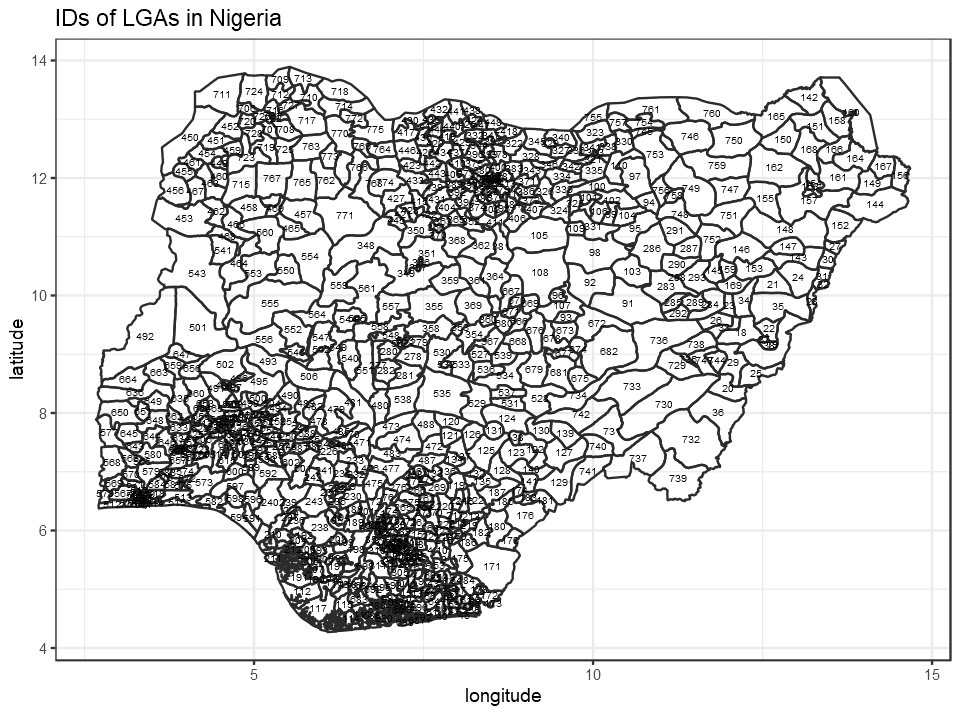

In [4]:
# arranging the background place to the map grid of LGAs
options(repr.plot.width=8,repr.plot.height=5.95)

### Draw a map
ggplot(data=nga.df,aes(map_id=id)) +
    geom_map(map=map,color="#2b2b2b",fill=NA) +
    guides(fill=FALSE,alpha=FALSE) +
    expand_limits(x=map$long,y=map$lat) +
    geom_text(aes(label=id,x=Longitude, y=Latitude),size=2) +
    labs(x = "longitude", y = "latitude", title = "IDs of LGAs in Nigeria") +
    theme_bw()

# 2012

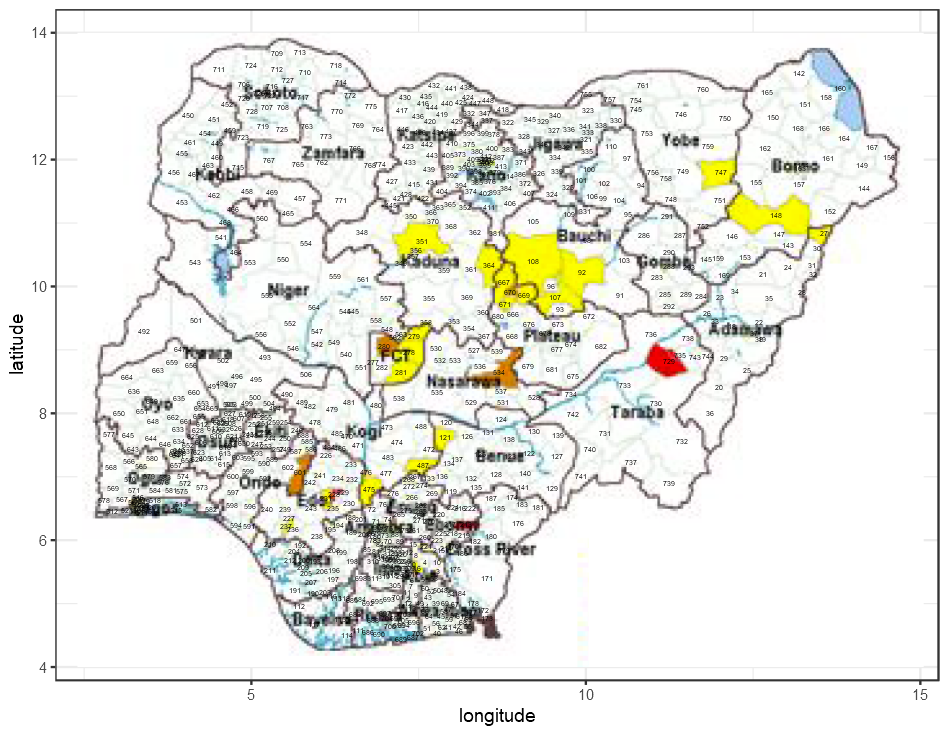

In [5]:
options(repr.plot.width=7.9,repr.plot.height=6.12)

img <- readPNG("../data/incidence2012w28.png") 
g <- rasterGrob(img, interpolate=TRUE) 

ggplot(data=nga.df,aes(map_id=id)) +
    annotation_custom(g, xmin=2.4, xmax=15.05, ymin=3.3, ymax=14.7) +
    geom_map(map=map,color=NA,fill=NA) + #"#2b2b2b"
    guides(fill=FALSE,alpha=FALSE) +
    expand_limits(x=map$long,y=map$lat) +
    geom_text(aes(label=id,x=Longitude, y=Latitude),size=1.4) +
    labs(x = "longitude", y = "latitude", title = NULL) +
    theme_bw()

Joining, by = "id"


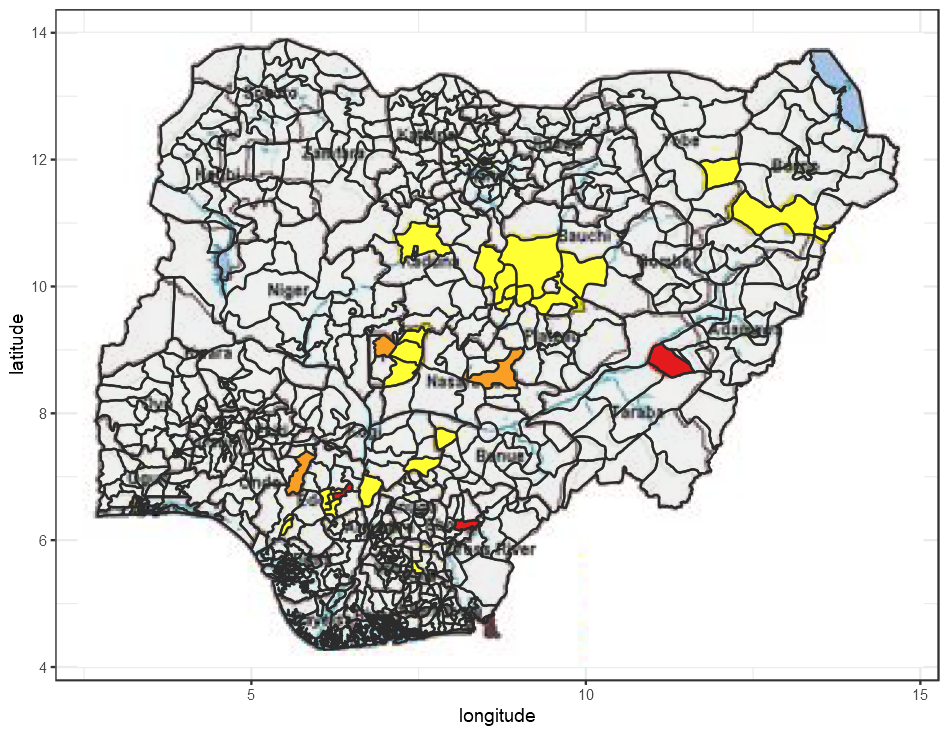

In [6]:
options(repr.plot.width=7.9,repr.plot.height=6.12)

incidenceYellow = c(351,356,364,108,92,107,669,670,671,667,364,747,148,
                    27,121,281,278,279,487,475,235,231,228,237,227,16
                    ) 
incidenceOrange = c(280,601,534) 
incidenceRed = c(729,229,213)

as.data.frame(list(id=unique(map$id),incidence_2012=NA)) -> dt
dt$id = as.integer(dt$id)

dt[dt$id %in% incidenceYellow,'incidence_2012'] = YellowMark
dt[dt$id %in% incidenceOrange,'incidence_2012'] = OrangeMark
dt[dt$id %in% incidenceRed,'incidence_2012'] = RedMark

myColors <- brewer.pal(5,"Set1")
names(myColors) <- levels(map$incidence_2012)
colScale <- scale_colour_manual(name="incidence",values=myColors)

ggplot(data=right_join(nga.df,dt),aes(map_id=id)) +
    annotation_custom(g, xmin=2.4, xmax=15.05, ymin=3.3, ymax=14.7) +
    geom_map(map=map,color="#2b2b2b",aes(fill=incidence_2012,alpha=ifelse(is.na(incidence_2012),0,1))) +
    scale_fill_gradientn(colours = brewer.pal(6,"Set1")[c(6,1)], values = c(0,1)) +
    guides(fill=FALSE,alpha=FALSE) +
    expand_limits(x=map$long,y=map$lat) +
#     coord_cartesian(expand=0,xlim=c(8.2,9),ylim=c(11.5,12.25)) + 
#     geom_text(aes(label=id,x=Longitude, y=Latitude),size=2) +
    labs(x = "longitude", y = "latitude", title = NULL) +
    theme_bw()

In [7]:
# Result
nga.df %<>% right_join(dt)

Joining, by = "id"


# 2013

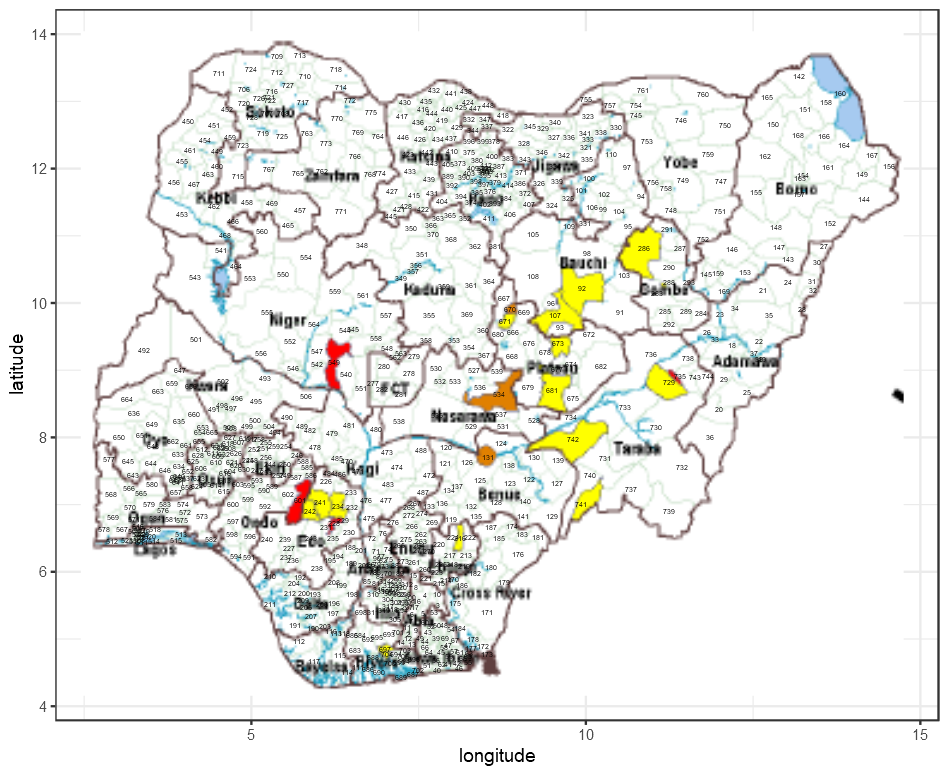

In [8]:
options(repr.plot.width=7.9,repr.plot.height=6.45)

img <- readPNG("../data/incidence2013.png") 
g <- rasterGrob(img, interpolate=TRUE) 

ggplot(data=nga.df,aes(map_id=id)) +
    annotation_custom(g, xmin=2.45, xmax=14.75, ymin=3.3, ymax=14.9) +
    geom_map(map=map,color=NA,fill=NA) + #"#2b2b2b"
    guides(fill=FALSE,alpha=FALSE) +
    expand_limits(x=map$long,y=map$lat) +
    geom_text(aes(label=id,x=Longitude, y=Latitude),size=1.4) +
    labs(x = "longitude", y = "latitude", title = NULL) +
    theme_bw()

Joining, by = "id"


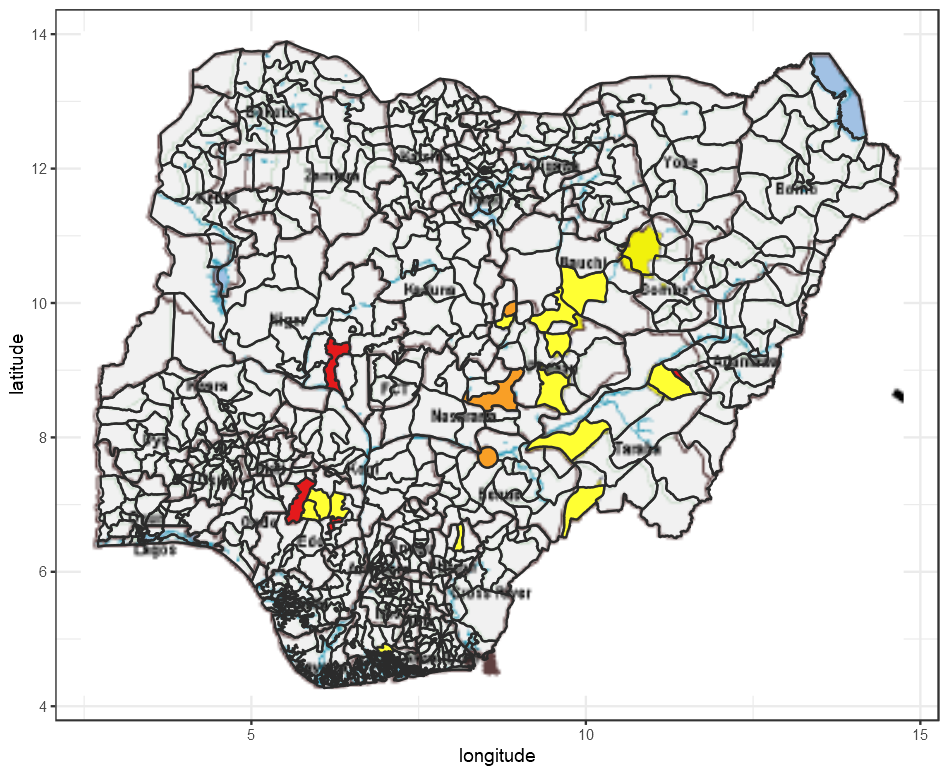

In [9]:
options(repr.plot.width=7.9,repr.plot.height=6.45)

incidenceYellow = c(742,741,729,241,234,242,107,92,673,681,671,697,
                    704,216
                    ) 
incidenceOrange = c(534,131,670) 
incidenceRed = c(601,549,735,228)

as.data.frame(list(id=unique(map$id),incidence_2013=NA)) -> dt
dt$id = as.integer(dt$id)

dt[dt$id %in% incidenceYellow,'incidence_2013'] = YellowMark
dt[dt$id %in% incidenceOrange,'incidence_2013'] = OrangeMark
dt[dt$id %in% incidenceRed,'incidence_2013'] = RedMark

myColors <- brewer.pal(5,"Set1")
names(myColors) <- levels(map$incidence_2013)
colScale <- scale_colour_manual(name="incidence",values=myColors)

ggplot(data=right_join(nga.df,dt),aes(map_id=id)) +
    annotation_custom(g, xmin=2.45, xmax=14.75, ymin=3.3, ymax=14.9) +
    geom_map(map=map,color="#2b2b2b",aes(fill=incidence_2013,alpha=ifelse(is.na(incidence_2013),0,1))) +
    scale_fill_gradientn(colours = brewer.pal(6,"Set1")[c(6,1)], values = c(0,1)) +
    guides(fill=FALSE,alpha=FALSE) +
    expand_limits(x=map$long,y=map$lat) +
#     coord_cartesian(expand=0,xlim=c(8.2,9),ylim=c(11.5,12.25)) + 
#     geom_text(aes(label=id,x=Longitude, y=Latitude),size=2) +
    labs(x = "longitude", y = "latitude", title = NULL) +
    theme_bw()

In [10]:
# Result
nga.df %<>% right_join(dt)

Joining, by = "id"


# 2014

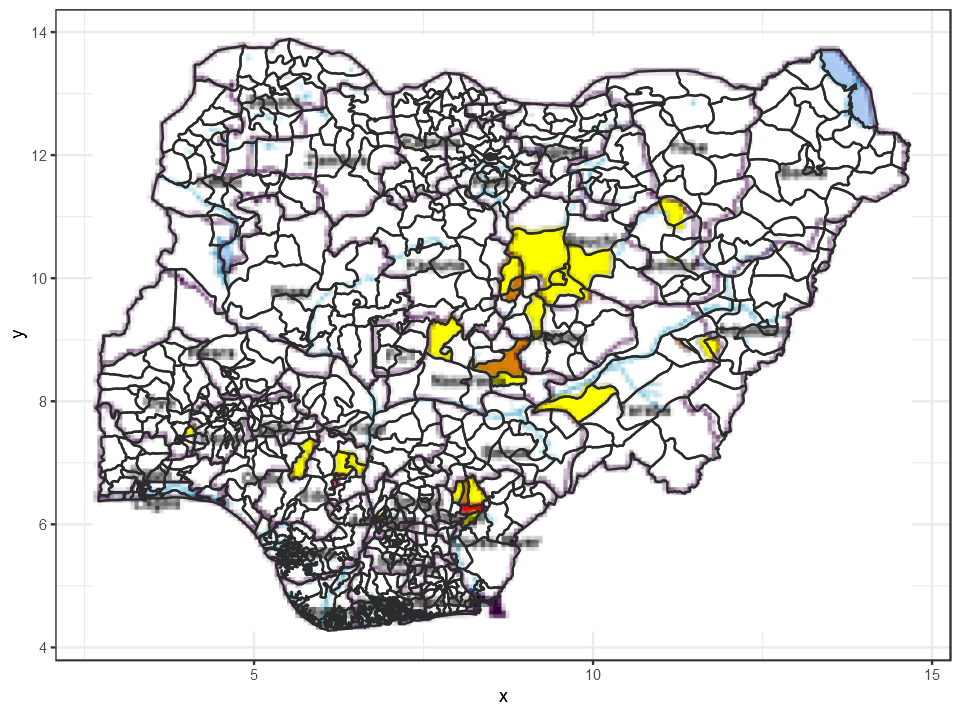

In [11]:
# arranging the background place to the map grid of LGAs
options(repr.plot.width=8,repr.plot.height=5.95)

img <- readPNG("../data/incidence2014.png") 
g <- rasterGrob(img, interpolate=TRUE) 

ggplot() +
    annotation_custom(g, xmin=2.62, xmax=14.7, ymin=1.35, ymax=16.85) +
    geom_map(data=map,map=map, aes(map_id=id),color="#2b2b2b",fill=NA) +
    expand_limits(x=map$long,y=map$lat) +
    guides(fill=FALSE,alpha=FALSE) +
    theme_bw()

Joining, by = "id"


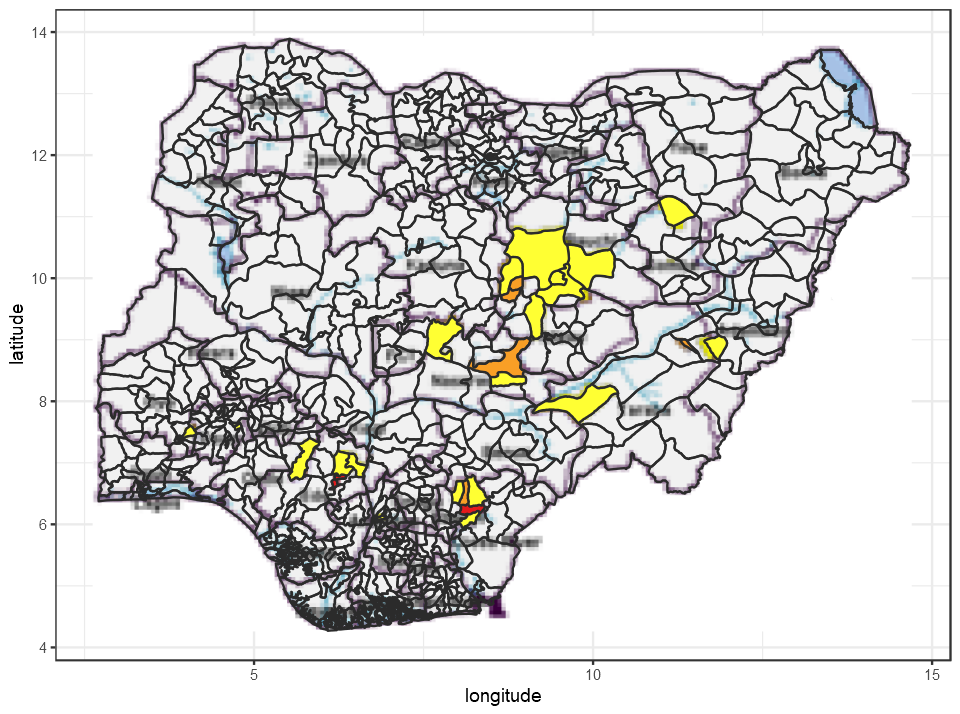

In [12]:
options(repr.plot.width=8,repr.plot.height=5.95)
incidenceYellow = c(291,288,744,92,108,667,676,537,742,530,224,222,219,234,232,601,652,107,96,79,620) 
incidenceOrange = c(735,670,671,534,216) 
incidenceRed = c(213,228)

as.data.frame(list(id=unique(map$id),incidence_2014=NA)) -> dt
dt$id = as.integer(dt$id)
dt[dt$id %in% incidenceYellow,'incidence_2014'] = YellowMark
dt[dt$id %in% incidenceOrange,'incidence_2014'] = OrangeMark
dt[dt$id %in% incidenceRed,'incidence_2014'] = RedMark

nga.df %<>% right_join(dt)

myColors <- brewer.pal(5,"Set1")
names(myColors) <- levels(map$incidence_2014)
colScale <- scale_colour_manual(name="incidence",values=myColors)

ggplot(data=nga.df,aes(map_id=id)) +
    annotation_custom(g, xmin=2.62, xmax=14.7, ymin=1.35, ymax=16.85) +
    geom_map(map=map,color="#2b2b2b",aes(fill=incidence_2014,alpha=ifelse(is.na(incidence_2014),0,1))) + #
    scale_fill_gradientn(colours = brewer.pal(6,"Set1")[c(6,1)], values = c(0,1)) +
    guides(fill=FALSE,alpha=FALSE) +
    expand_limits(x=map$long,y=map$lat) +
#     geom_text(aes(label=id,x=Longitude,y=Latitude),size=1.75) +
    labs(x = "longitude", y = "latitude", title = NULL) +
    theme_bw()

# 2015

Regions defined for each Polygons


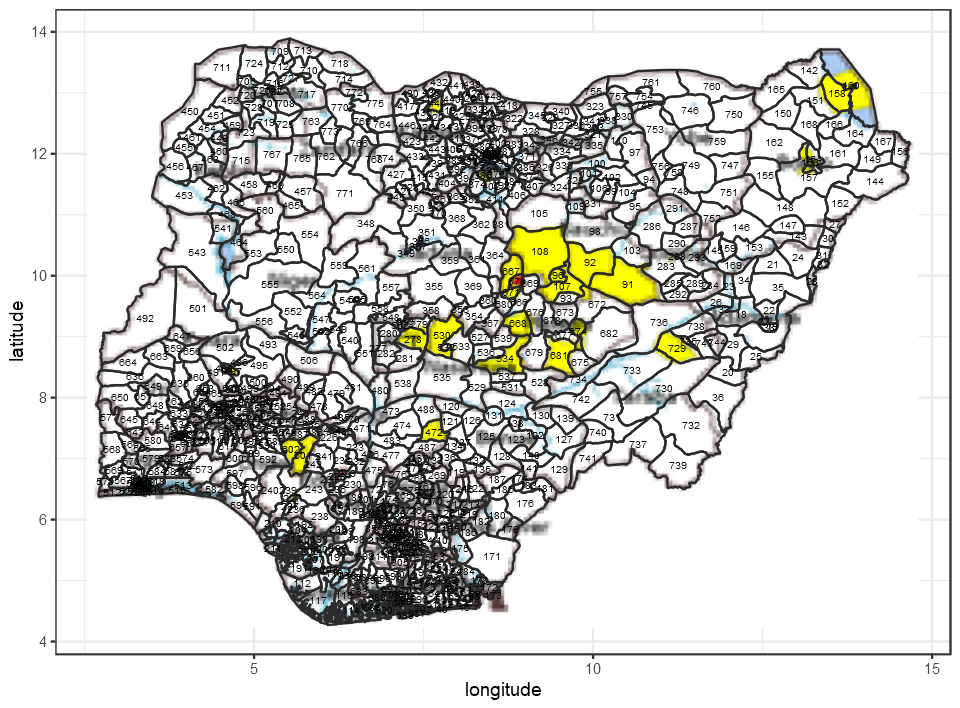

In [13]:
# arranging the background place to the map grid of LGAs
options(repr.plot.width=8,repr.plot.height=5.9)

nga <- getData("GADM", country = "Nigeria", level = 2)
map <- fortify(nga)

img <- readPNG("../data/incidence2015.png") 
g <- rasterGrob(img, interpolate=TRUE) 

ggplot(data=nga.df,aes(map_id=id)) +
    annotation_custom(g, xmin=2.54, xmax=14.8, ymin=1.2, ymax=17) +
    geom_map(map=map,color="#2b2b2b",fill=NA) +
    guides(fill=FALSE,alpha=FALSE) +
    expand_limits(x=map$long,y=map$lat) +
    geom_text(aes(label=id,x=Longitude, y=Latitude),size=2) +
    labs(x = "longitude", y = "latitude", title = NULL) +
    theme_bw()

Regions defined for each Polygons
Joining, by = "id"


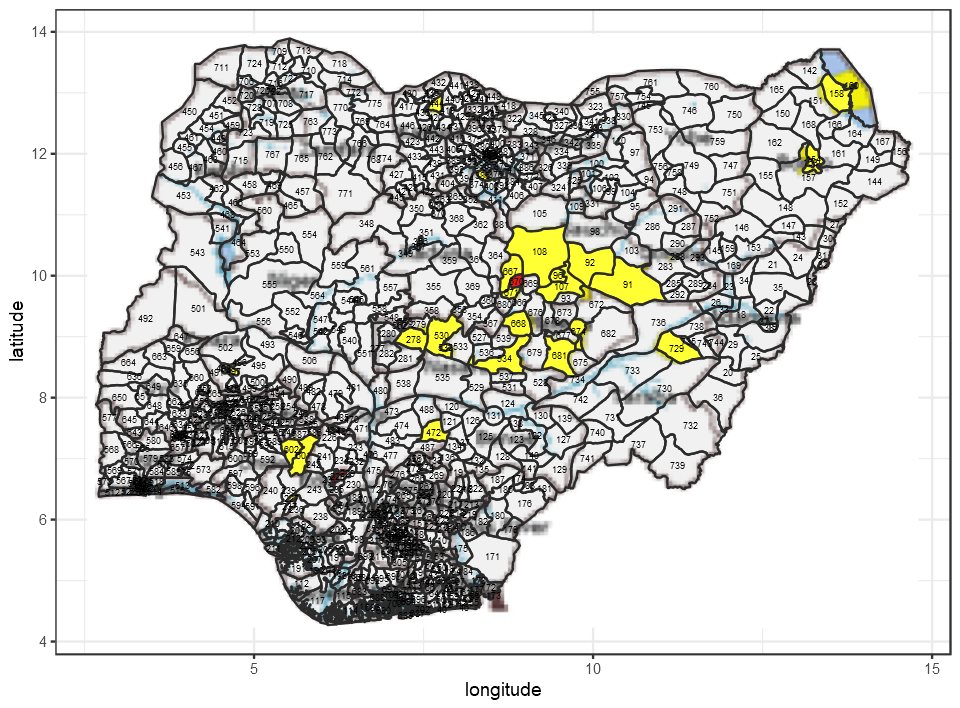

In [14]:
map <- fortify(nga)
incidenceYellow = c(444,158,163,729,91,92,108,96,107,674,681,668,534,671,667,
                    530,532,278,385,497,602,601,227,472,729,288,154) 
incidenceOrange = c() 
incidenceRed = c(670,228)

as.data.frame(list(id=unique(map$id),incidence_2015=NA)) -> dt
dt$id = as.integer(dt$id)
dt[dt$id %in% incidenceYellow,'incidence_2015'] = YellowMark
dt[dt$id %in% incidenceOrange,'incidence_2015'] = OrangeMark
dt[dt$id %in% incidenceRed,'incidence_2015'] = RedMark

nga.df %<>% right_join(dt)

myColors <- brewer.pal(5,"Set1")
names(myColors) <- levels(map$incidence_2015)
colScale <- scale_colour_manual(name="incidence",values=myColors)

ggplot(data=nga.df,aes(map_id=id)) +
    annotation_custom(g, xmin=2.54, xmax=14.8, ymin=1.2, ymax=17) +
    geom_map(map=map,color="#2b2b2b",aes(fill=incidence_2015,alpha=ifelse(is.na(incidence_2015),0,1))) +
    scale_fill_gradientn(colours = brewer.pal(6,"Set1")[c(6,1)], values = c(0,1)) +
    guides(fill=FALSE,alpha=FALSE) +
    expand_limits(x=map$long,y=map$lat) +
    geom_text(aes(label=id,x=Longitude, y=Latitude),size=1.7) +
    labs(x = "longitude", y = "latitude", title = NULL) +
    theme_bw()

# 2016

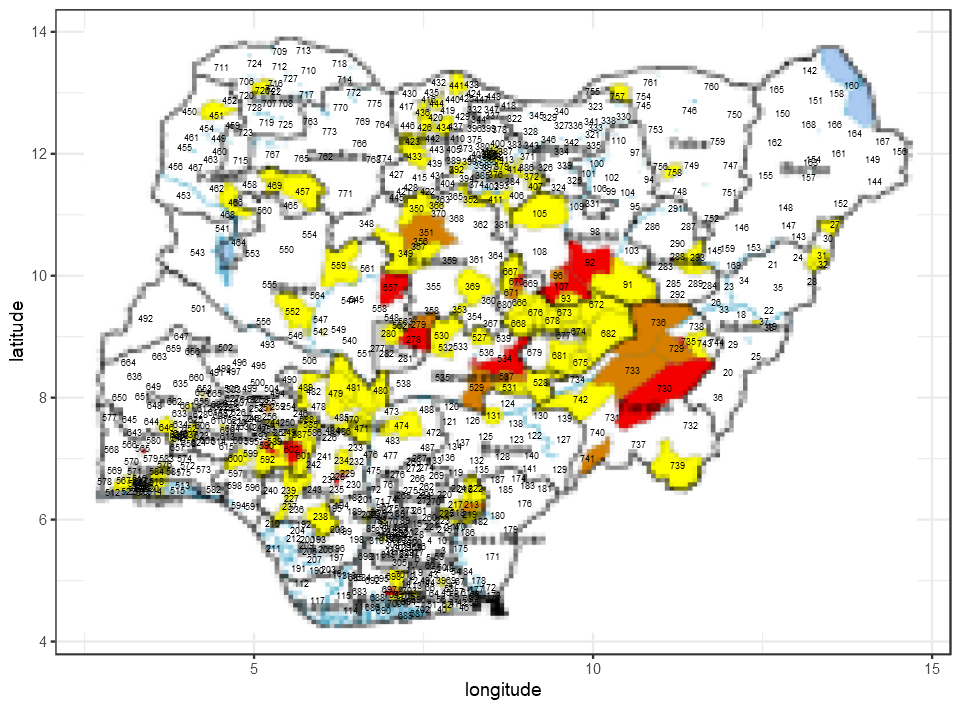

In [15]:
# arranging the background place to the map grid of LGAs
options(repr.plot.width=8,repr.plot.height=5.9)

img <- readPNG("../data/incidence2016.png") 
g <- rasterGrob(img, interpolate=TRUE) 

ggplot(data=nga.df,aes(map_id=id)) +
    annotation_custom(g, xmin=2.49, xmax=14.78, ymin=1.2, ymax=17) +
    geom_map(map=map,color=NA,fill=NA) + #"#2b2b2b"
    guides(fill=FALSE,alpha=FALSE) +
    expand_limits(x=map$long,y=map$lat) +
    geom_text(aes(label=id,x=Longitude, y=Latitude),size=1.7) +
    labs(x = "longitude", y = "latitude", title = NULL) +
    theme_bw()

## Data imputation

Joining, by = "id"


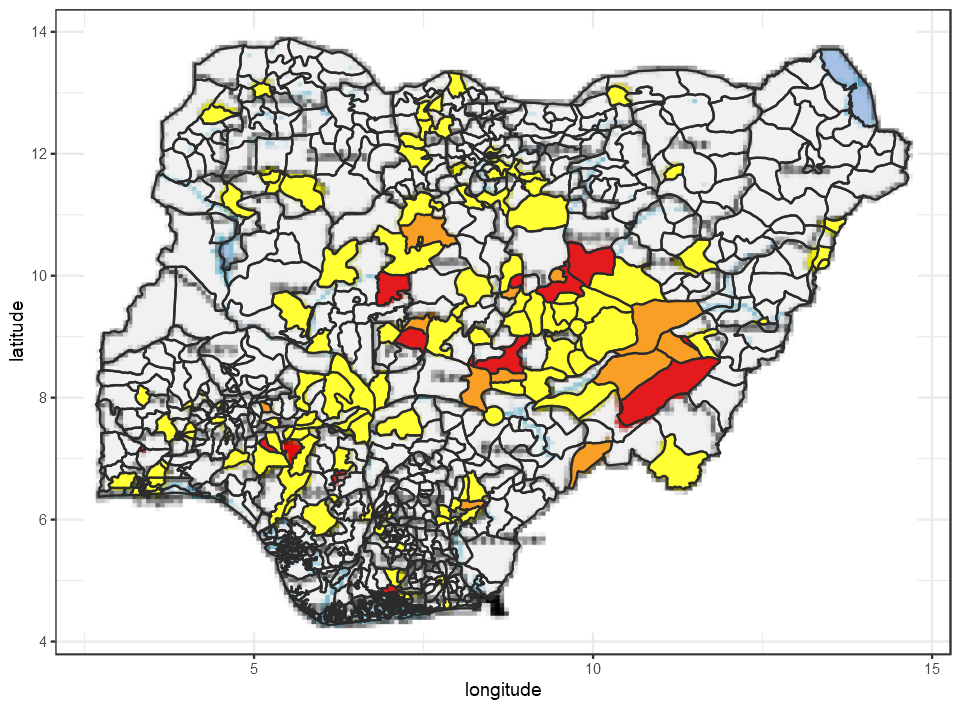

In [16]:
options(repr.plot.width=8,repr.plot.height=5.9)

incidenceYellow = c(407,414,379,376,408,382,391,401,412,441,27,31,32,293,
                    758,757,105,411,352,434,444,436,426,423,433,350,366,
                    356,357,349,559,457,469,466,451,726,552,480,481,479,
                    489,470,471,474,131,527,668,676,678,673,666,527,530,
                    353,369,667,91,672,682,671,675,528,531,742,743,739,37,
                    222,216,217,219,223,225,301,39,62,693,704,705,81,202,
                    73,237,239,227,238,592,589,601,587,588,585,600,567,518,
                    584,576,646,661,651,610,510,520,514,244,249,587,
                    631,654,613,234,372,681,674,93,280,637,652
                    ) 
incidenceOrange = c(351,529,279,671,96,537,529,736,733,729,741,213,251) 
incidenceRed = c(288,557,534,278,670,107,92,730,735,697,590,565,228)

as.data.frame(list(id=unique(map$id),incidence_2016=NA)) -> dt
dt$id = as.integer(dt$id)

dt[dt$id %in% incidenceYellow,'incidence_2016'] = YellowMark
dt[dt$id %in% incidenceOrange,'incidence_2016'] = OrangeMark
dt[dt$id %in% incidenceRed,'incidence_2016'] = RedMark

myColors <- brewer.pal(5,"Set1")
names(myColors) <- levels(map$incidence_2016)
colScale <- scale_colour_manual(name="incidence",values=myColors)

ggplot(data=right_join(nga.df,dt),aes(map_id=id)) +
    annotation_custom(g, xmin=2.49, xmax=14.78, ymin=1.4, ymax=16.8) +
    geom_map(map=map,color="#2b2b2b",aes(fill=incidence_2016,alpha=ifelse(is.na(incidence_2016),0,1))) +
    scale_fill_gradientn(colours = brewer.pal(6,"Set1")[c(6,1)], values = c(0,1)) +
    guides(fill=FALSE,alpha=FALSE) +
    expand_limits(x=map$long,y=map$lat) +
    labs(x = "longitude", y = "latitude", title = NULL) +
    theme_bw()

In [17]:
# Result
nga.df %<>% right_join(dt)

Joining, by = "id"


# 2017

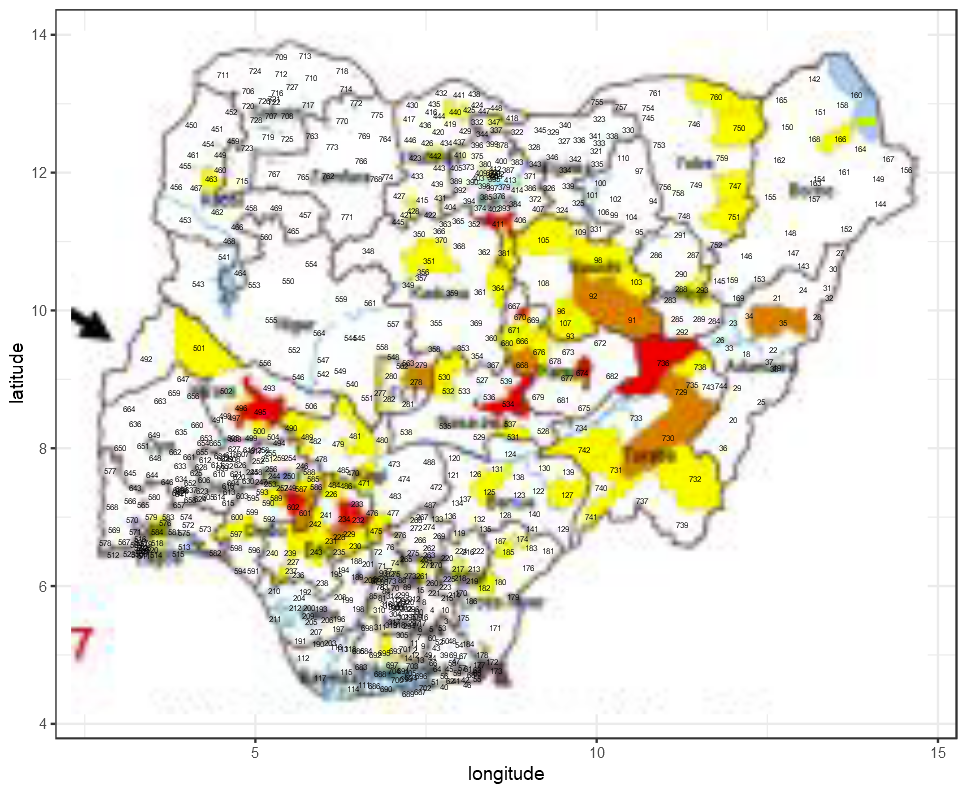

In [18]:
# arranging the background place to the map grid of LGAs
options(repr.plot.width=8.05,repr.plot.height=6.6)

img <- readPNG("../data/incidence2017.png") 
g <- rasterGrob(img, interpolate=TRUE) 

ggplot(data=nga.df,aes(map_id=id)) +
    annotation_custom(g, xmin=2.3, xmax=14.85, ymin=3.4, ymax=14.8) +
    geom_map(map=map,color=NA,fill=NA) + #"#2b2b2b" 
    guides(fill=FALSE,alpha=FALSE) +
    expand_limits(x=map$long,y=map$lat) +
    geom_text(aes(label=id,x=Longitude, y=Latitude),size=1.6) +
    labs(x = "longitude", y = "latitude", title = NULL) +
    theme_bw()

Joining, by = "id"


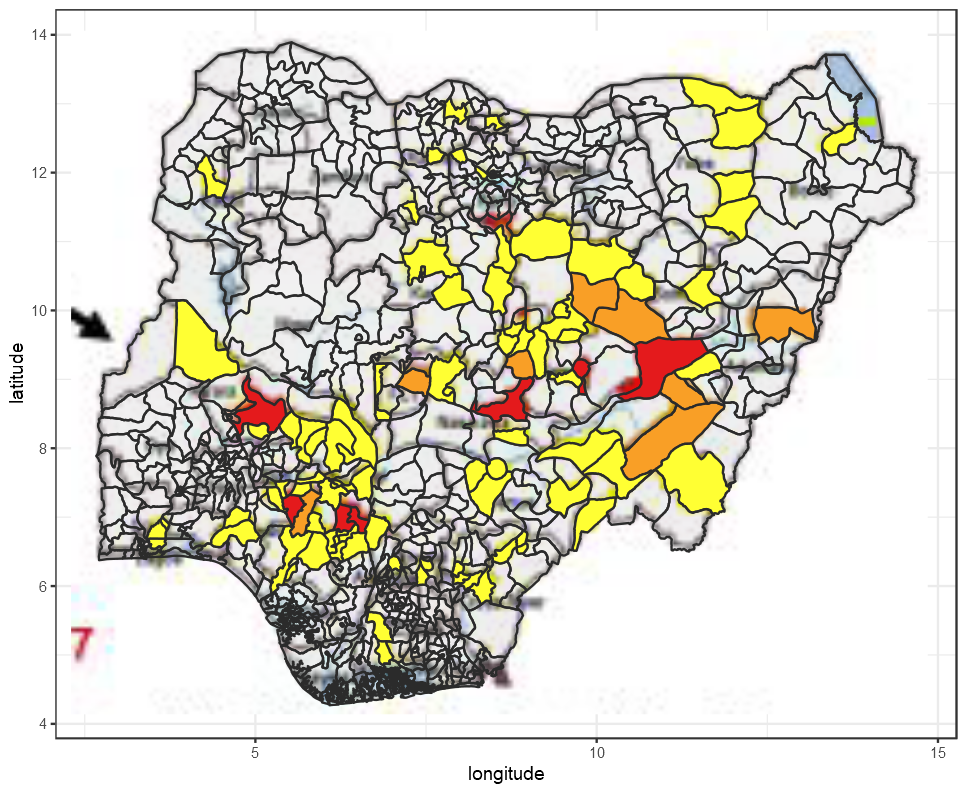

In [19]:
options(repr.plot.width=8.05,repr.plot.height=6.6)

incidenceYellow = c(501,576,518,597,600,237,239,242,243,235,231,228,229,230,475,471,226,484,486,226,589,490,489,482,479,481,126,
                    125,131,127,174,185,182,217,218,219,741,731,742,732,736,103,107,96,93,676,666,671,680,530,532,277,359,356,351,
                    105,381,364,463,428,442,409,347,347,747,751,166,750,463,584,440,531,410,695,500,587,585,293,257,738,760,98,
                    311,261,271,74,677
                    ) 
incidenceOrange = c(730,729,278,601,35,668,92,91) 
incidenceRed = c(674,411670,534,674,736,602,234,232,495)

as.data.frame(list(id=unique(map$id),incidence_2017=NA)) -> dt
dt$id = as.integer(dt$id)

dt[dt$id %in% incidenceYellow,'incidence_2017'] = YellowMark
dt[dt$id %in% incidenceOrange,'incidence_2017'] = OrangeMark
dt[dt$id %in% incidenceRed,'incidence_2017'] = RedMark

myColors <- brewer.pal(5,"Set1")
names(myColors) <- levels(map$incidence_2017)
colScale <- scale_colour_manual(name="incidence",values=myColors)

ggplot(data=right_join(nga.df,dt),aes(map_id=id)) +
    annotation_custom(g, xmin=2.3, xmax=14.85, ymin=3.4, ymax=14.8) +
    geom_map(map=map,color="#2b2b2b",aes(fill=incidence_2017,alpha=ifelse(is.na(incidence_2017),0,1))) +
    scale_fill_gradientn(colours = brewer.pal(6,"Set1")[c(6,1)], values = c(0,1)) +
    guides(fill=FALSE,alpha=FALSE) +
    expand_limits(x=map$long,y=map$lat) +
    labs(x = "longitude", y = "latitude", title = NULL) +
    theme_bw()

In [20]:
# Result
nga.df %<>% right_join(dt)

Joining, by = "id"


# 2018

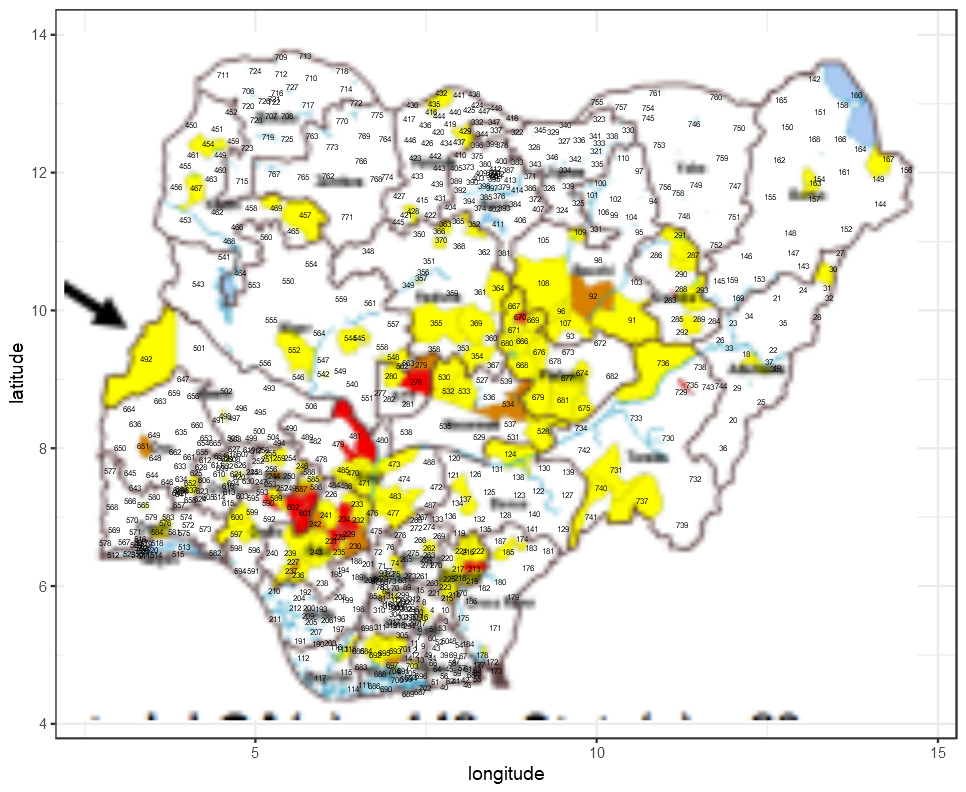

In [21]:
# arranging the background place to the map grid of LGAs
options(repr.plot.width=8.05,repr.plot.height=6.6)

img <- readPNG("../data/incidence2018upto24w.png") 
g <- rasterGrob(img, interpolate=TRUE) 

ggplot(data=nga.df,aes(map_id=id)) +
    annotation_custom(g, xmin=2.2, xmax=14.7, ymin=2, ymax=16.1) +
    geom_map(map=map,color=NA,fill=NA) + #"#2b2b2b" 
    guides(fill=FALSE,alpha=FALSE) +
    expand_limits(x=map$long,y=map$lat) +
    geom_text(aes(label=id,x=Longitude, y=Latitude),size=1.6) +
    labs(x = "longitude", y = "latitude", title = NULL) +
    theme_bw()

Joining, by = "id"


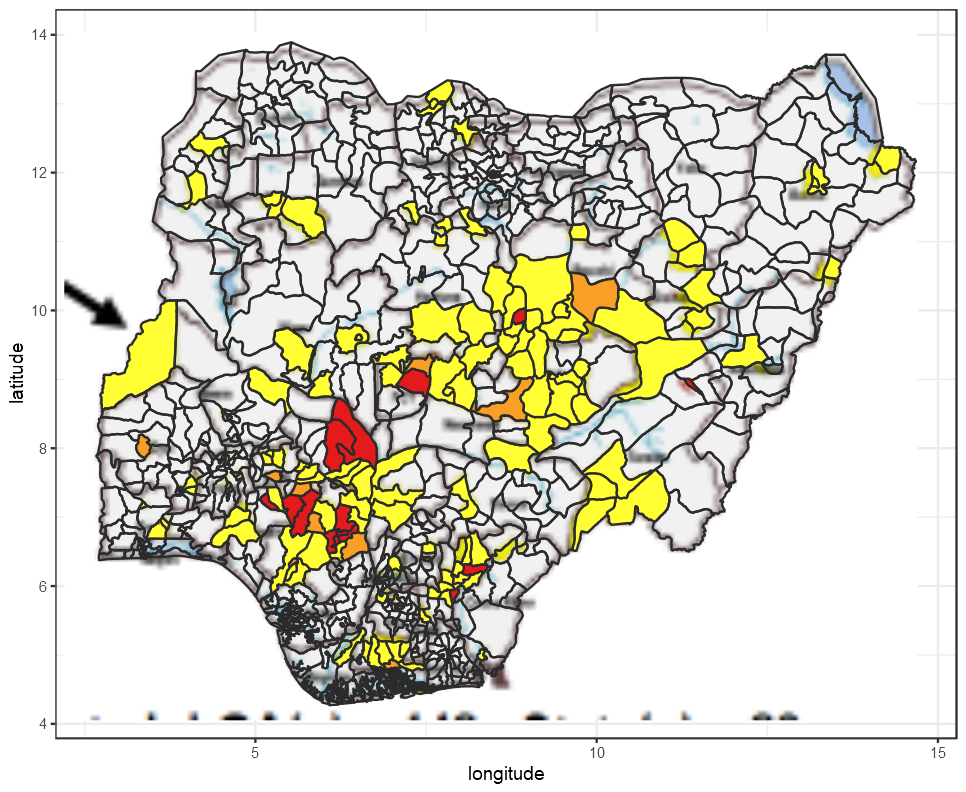

In [22]:
options(repr.plot.width=8.05,repr.plot.height=6.6)

incidenceYellow = c(454,467,469,457,428,370,363,352,429,416,435,432,109,291,287,293,289,30,154,167,163,18,731,740,737,
                    565,741,108,364,667,671,666,680,668,676,107,96,108,91,736,679,681,677,674,675,528,124,222,216,221,137,473,485,
                    470,471,483,477,137,262,74,81,492,217,225,218,219,223,215,214,16,692,695,693,701,703,178,81,93,
                    600,584,565,652,597,236,237,239,243,493,552,259,251,255,246,585,588,544,548,280,530,532,533,124,
                    576,652,637,355,369,354,241,585,669,118,233,232,589,684,235
                    ) 
incidenceOrange = c(227,651,687,244,230,697,534,279,92,242,587) 
incidenceRed = c(670,278,479,481,590,602,214,601,590,735,234,229,228,231,213)

as.data.frame(list(id=unique(map$id),incidence_2018=NA)) -> dt
dt$id = as.integer(dt$id)

dt[dt$id %in% incidenceYellow,'incidence_2018'] = YellowMark
dt[dt$id %in% incidenceOrange,'incidence_2018'] = OrangeMark
dt[dt$id %in% incidenceRed,'incidence_2018'] = RedMark

myColors <- brewer.pal(5,"Set1")
names(myColors) <- levels(map$incidence_2018)
colScale <- scale_colour_manual(name="incidence",values=myColors)

ggplot(data=right_join(nga.df,dt),aes(map_id=id)) +
    annotation_custom(g, xmin=2.2, xmax=14.7, ymin=2, ymax=16.1) +
    geom_map(map=map,color="#2b2b2b",aes(fill=incidence_2018,alpha=ifelse(is.na(incidence_2018),0,1))) +
    scale_fill_gradientn(colours = brewer.pal(6,"Set1")[c(6,1)], values = c(0,1)) +
    guides(fill=FALSE,alpha=FALSE) +
    expand_limits(x=map$long,y=map$lat) +
#     coord_cartesian(expand=0,xlim=c(2.5,5),ylim=c(6,7)) + 
#     coord_cartesian(expand=0,xlim=c(8.2,9),ylim=c(11.5,12.25)) + 
#     geom_text(aes(label=id,x=Longitude, y=Latitude),size=2) +
    labs(x = "longitude", y = "latitude", title = NULL) +
    theme_bw()

In [23]:
# Result
nga.df %<>% right_join(dt)

Joining, by = "id"


# Final plot

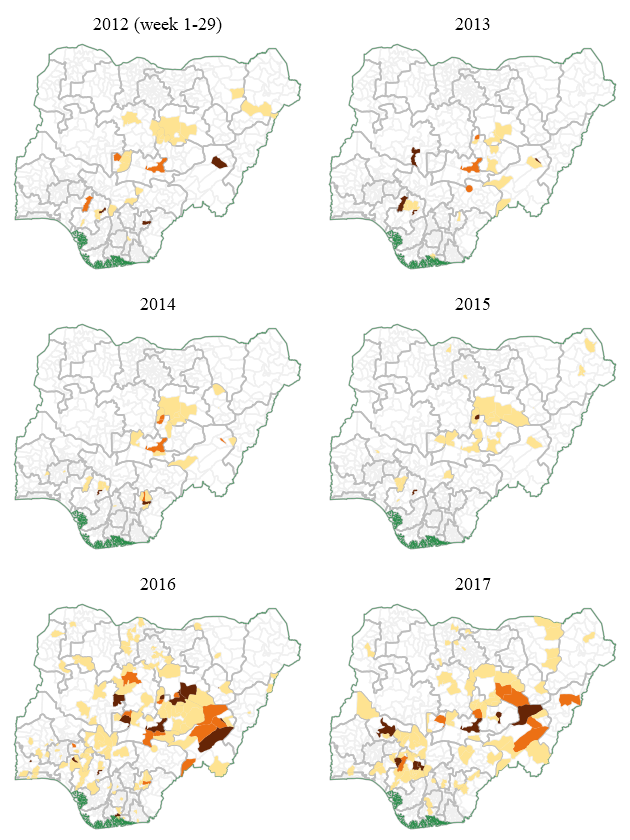

In [56]:
options(repr.plot.width=4.75,repr.plot.height=7) 

cl0 = brewer.pal(8,"BuGn")[7]
cl1 = brewer.pal(8,"Greys")[4]
cl2 = brewer.pal(8,"Greys")[2]
ciYellowMark = brewer.pal(9,"YlOrBr")[3] #brewer.pal(6,"Set1")[5]
ciOrangeMark = brewer.pal(9,"YlOrBr")[6] #brewer.pal(6,"Set1")[1]
ciRedMark = brewer.pal(9,"YlOrBr")[9] #'black'

labs_df = data.frame(Year=seq(2012,2018),Label=c("2012 (week 1-29)","2013","2014","2015","2016","2017","2018 (week 1-24)"))

getPlot = function(yr) {
    nga.df %>% rename(incidence='incidence_'%&%yr) %>% select(id,incidence) %>% na.omit -> df__
    
    ggplot() +
        geom_map(data=map,map=map,aes(map_id=id),fill=NA,color=cl2,size=.3) +
        geom_map(data=map1,map=map1,aes(map_id=id),fill=NA,color=cl1,size=.35) +
        geom_map(data=map0,map=map0,aes(map_id=id),alpha=0,fill=NA,color=cl0,size=.1) +
        geom_map(data=df__,map=map,aes(map_id=id,fill=incidence)) +
        expand_limits(x=map$long,y=map$lat) +
        scale_fill_gradientn(colours=c(ciYellowMark,ciOrangeMark,ciRedMark),values=c(0,1)) +
        guides(fill=FALSE,alpha=FALSE) + 
        labs(title=filter(labs_df,Year==yr)$Label) + 
        theme_void(base_size = 10,base_family='Times') +
        theme(plot.title = element_text(hjust=.5,vjust=1,size=10.5),
        plot.margin = unit(c(.4,0,0,0),"lines"))
}

grid.arrange(ggplotGrob(getPlot(2012)), ggplotGrob(getPlot(2013)), ggplotGrob(getPlot(2014)), 
             ggplotGrob(getPlot(2015)), ggplotGrob(getPlot(2016)), ggplotGrob(getPlot(2017)), nrow=3)

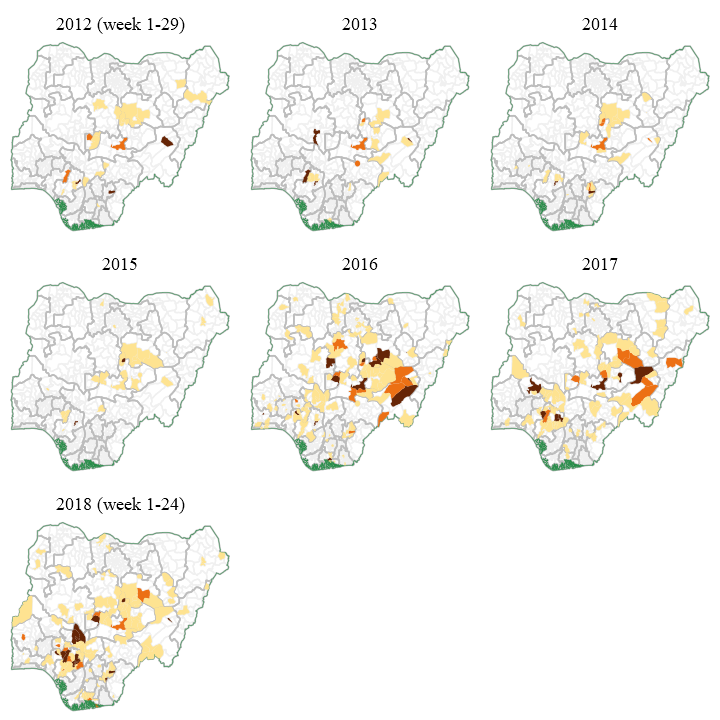

In [82]:
cs = c(6,6)
options(repr.plot.width=cs[1],repr.plot.height=cs[2]) 

grid.arrange(ggplotGrob(getPlot(2012)), ggplotGrob(getPlot(2013)), ggplotGrob(getPlot(2014)), 
             ggplotGrob(getPlot(2015)), ggplotGrob(getPlot(2016)), ggplotGrob(getPlot(2017)),
             ggplotGrob(getPlot(2018)), grid.rect(gp=gpar(col="white")), grid.rect(gp=gpar(col="white")), 
             nrow=3) -> pltMap

ggsave(plot=pltMap,width=cs[1],height=cs[2],filename="../figures/FigS5.pdf", useDingbats=TRUE)

# Rodent niche

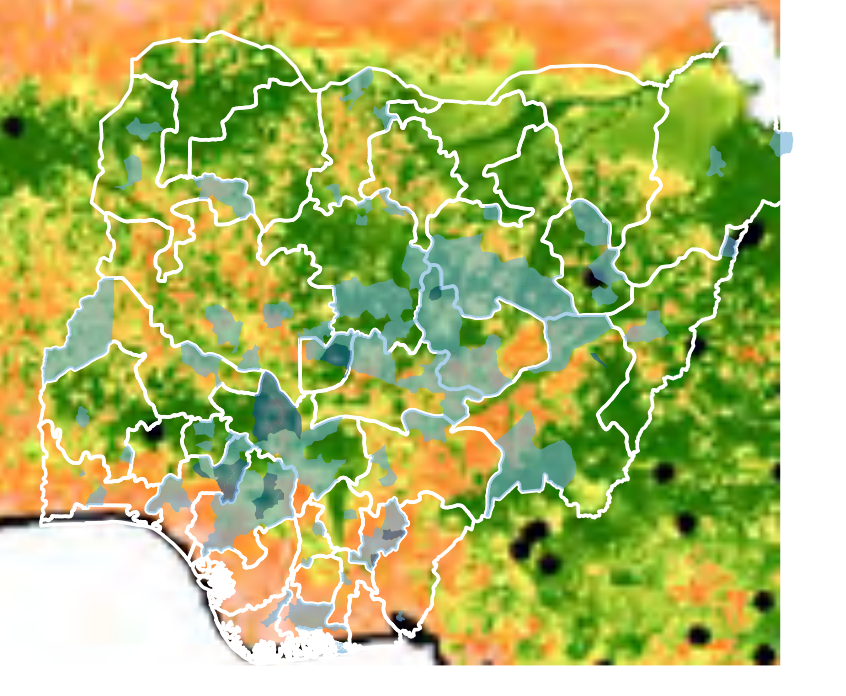

In [71]:
options(repr.plot.width=7.05,repr.plot.height=5.8)

img <- readPNG("../data/niche.png") 
g <- rasterGrob(img, interpolate=TRUE) 

yr0 = 2018

nga.df %>% rename(incidence='incidence_'%&%yr0) -> nga.df_
nga.df_ %>%
    ggplot(aes(map_id=id)) +
        annotation_custom(g, xmin=.7, xmax=14.25, ymin=2.4, ymax=17.2) +
    #     geom_map(map=map,color="white",fill=NA,size=.25) + #"#2b2b2b"
        geom_map(data=map1,map=map1,aes(map_id=id),fill=NA,color="white",size=.75) +
        geom_map(data=na.omit(select(nga.df_,id,incidence)),map=map,aes(map_id=id,fill=incidence),alpha=.6) +
        guides(fill=FALSE,alpha=FALSE) +
        scale_fill_gradientn(colours=brewer.pal(9,"Blues")[c(5,5,8)],values=c(0,1)) +
        expand_limits(x=map$long,y=map$lat) +
    #     geom_text(aes(label=id,x=Longitude, y=Latitude),size=1.4) +
        labs(x = "longitude", y = "latitude", title = NULL) +
        theme_void()